In [26]:
import sqlite3 as db
import json
import pandas as pd
import numpy as np
from glob import glob
import pandas_profiling

import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
cd ~/columnclasses/

/home/jupyter/columnclasses


In [4]:
# get tables

con = db.connect("./extract-to-root-3/db.sqlite3")

cur = con.cursor()

for row in cur.execute("SELECT name FROM sqlite_master WHERE type='table';"):
    print(row)
    
con.close()

('django_migrations',)
('sqlite_sequence',)
('auth_group_permissions',)
('auth_user_groups',)
('auth_user_user_permissions',)
('django_admin_log',)
('django_content_type',)
('auth_permission',)
('auth_user',)
('auth_group',)
('classifier_classification',)
('classifier_classification_subclasses',)
('classifier_source',)
('classifier_column',)
('django_session',)


In [5]:
filesource = "./extract-to-root-3/analysis/"
file_glob = glob(filesource+"*")

In [6]:
file_glob[0:10]

['./extract-to-root-3/analysis/Preforeclosures_06.json',
 './extract-to-root-3/analysis/912test.json',
 './extract-to-root-3/analysis/VPrem_Formatted-4-5-2019.json',
 './extract-to-root-3/analysis/VPrem_Formatted-7-23-2019.json',
 './extract-to-root-3/analysis/NONUMBER8-3AUGUST2019.json',
 './extract-to-root-3/analysis/Ivy-Re_08-24-2019.json',
 './extract-to-root-3/analysis/Workbook20.json',
 './extract-to-root-3/analysis/Ivy-Re_07-13-2019-1.json',
 './extract-to-root-3/analysis/Ive_copy.json',
 './extract-to-root-3/analysis/IVY1.json']

In [7]:
df = pd.read_json(file_glob[39])
df = df.T

In [8]:
df

,frac_alpha,frac_can_zip_patt,frac_canada,frac_cities,frac_counties,frac_digit,frac_fips,frac_given,frac_other,frac_space,...,main,mean_line_length,mean_token_count,mean_token_length,median_line_length,row_count,std_line_length,sub,unq_char_count,unq_token_count
0,1,0,0,0.571429,0.0714286,0,0,0.714286,0,0,...,partname,5.92857,1,5.92857,6,14,0.960973,first,22,13
1,1,0,0,0.428571,0.285714,0,0,0,0,0,...,partname,6.28571,1,6.28571,6,14,1.27775,last,22,13
2,0.587963,0,0,0.204545,0,0.273148,0,0,0,0.138889,...,street,15.4286,3.14286,4.22727,15,14,2.0947,situs,34,35
3,1,0,0,1,0,0,0,0,0,0,...,city,8,1,8,8,14,0,situs,7,1
4,1,0,0,0,0,0,0,0,0,0,...,state,2,1,2,2,14,0,situs,2,1
5,0,0,0,0,0,1,0,0,0,0,...,zipcode,5,1,5,5,14,0,situs,4,1
6,0.587963,0,0,0.170213,0.0212766,0.259259,0,0,0,0.152778,...,street,15.4286,3.35714,3.89362,16,14,2.84641,mailing,34,38
7,0.991228,0,0,1,0.133333,0,0,0,0,0.00877193,...,city,8.14286,1.07143,7.53333,8,14,1.12486,mailing,21,7
8,1,0,0,0,0,0,0,0,0,0,...,state,2,1,2,2,14,0,mailing,4,2
9,0,0,0,0,0,1,0,0,0,0,...,zipcode,5,1,5,5,14,0,mailing,9,6


In [10]:
# note, label and main were moved to the top for convenience
df_cols = ['label',
 'main',
 'sub',
 'frac_alpha',
 'frac_digit',
 'frac_other',
 'frac_space',
 'mean_line_length',
 'mean_token_count',
 'mean_token_length',
 'median_line_length',
 'row_count',
 'std_line_length',
 'unq_char_count',
 'unq_token_count']

In [11]:
df[df_cols]

,label,main,sub,frac_alpha,frac_digit,frac_other,frac_space,mean_line_length,mean_token_count,mean_token_length,median_line_length,row_count,std_line_length,unq_char_count,unq_token_count
0,partnamefirst,partname,first,1,0,0,0,5.92857,1,5.92857,6,14,0.960973,22,13
1,partnamelast,partname,last,1,0,0,0,6.28571,1,6.28571,6,14,1.27775,22,13
2,streetsitus,street,situs,0.587963,0.273148,0,0.138889,15.4286,3.14286,4.22727,15,14,2.0947,34,35
3,citysitus,city,situs,1,0,0,0,8,1,8,8,14,0,7,1
4,statesitus,state,situs,1,0,0,0,2,1,2,2,14,0,2,1
5,zipcodesitus,zipcode,situs,0,1,0,0,5,1,5,5,14,0,4,1
6,streetmailing,street,mailing,0.587963,0.259259,0,0.152778,15.4286,3.35714,3.89362,16,14,2.84641,34,38
7,citymailing,city,mailing,0.991228,0,0,0.00877193,8.14286,1.07143,7.53333,8,14,1.12486,21,7
8,statemailing,state,mailing,1,0,0,0,2,1,2,2,14,0,4,2
9,zipcodemailing,zipcode,mailing,0,1,0,0,5,1,5,5,14,0,9,6


In [16]:
# field definition strings
file_col_id = 'file_col_id'
source_file = 'source_file'
file_number = 'file_no'

# note, label and main were moved to the top for convenience
kept_col_list =[file_col_id,
                source_file,
                file_number,
                 'label',
                 'main',
                 'sub',
                 'frac_alpha',
                 'frac_digit',
                 'frac_other',
                 'frac_space',
                 'mean_line_length',
                 'mean_token_count',
                 'mean_token_length',
                 'median_line_length',
                 'row_count',
                 'std_line_length',
                 'unq_char_count',
                 'unq_token_count']

df_total_bulk = pd.DataFrame()
df_total = pd.DataFrame()

file_counter = 0

columnnames = ['file_no', 'file_path']

for file in file_glob:
    _df = pd.read_json(file)
    _df = _df.T  # transposes so the features are col names and pushes the column numbers into a column
    _df.reset_index(inplace=True)
    _df.rename(columns={'index':file_col_id}, inplace=True)
    _df[file_col_id] = pd.to_numeric(_df[file_col_id])
    _df.sort_values(file_col_id,inplace=True)
    
    _df[source_file] = file
    _df[file_number] = file_counter
    
    collist = _df.columns.tolist()

    file_counter += 1
#     print(file_counter)
    if file_counter % 100 == 0:
        print( 'file ',file_counter)

    df_total_bulk = df_total_bulk.append(_df,ignore_index=True)
#     display(df_total_bulk.tail())
    df_total = df_total_bulk.loc[:,kept_col_list].copy()
    
# df_total_bulk.head()
# df_total.describe()
df_total.head(10)
df_total.columns

Index(['file_col_id', 'source_file', 'file_no', 'label', 'main', 'sub',
       'frac_alpha', 'frac_digit', 'frac_other', 'frac_space',
       'mean_line_length', 'mean_token_count', 'mean_token_length',
       'median_line_length', 'row_count', 'std_line_length', 'unq_char_count',
       'unq_token_count'],
      dtype='object')

In [33]:
report = pandas_profiling.ProfileReport(df_total)

In [34]:
report

In [36]:
report.description_set

{'correlations': {'cramers':                 label      main  source_file       sub
  label        1.000000  0.995770     0.156392  0.993106
  main         0.995770  1.000000     0.175855  0.725608
  source_file  0.156392  0.175855     1.000000  0.232286
  sub          0.993106  0.725608     0.232286  1.000000,
  'kendall':                     file_col_id   file_no  frac_alpha  frac_digit  frac_other  \
  file_col_id            1.000000  0.035254   -0.372857   -0.061562   -0.162772   
  file_no                0.035254  1.000000   -0.065100   -0.116989   -0.157811   
  frac_alpha            -0.372857 -0.065100    1.000000   -0.144966    0.248526   
  frac_digit            -0.061562 -0.116989   -0.144966    1.000000    0.515849   
  frac_other            -0.162772 -0.157811    0.248526    0.515849    1.000000   
  frac_space            -0.360825 -0.109175    0.307605    0.381578    0.506021   
  mean_line_length      -0.326566 -0.116735    0.240643    0.359602    0.546718   
  mean_token

In [32]:
pairplot_df = df_total[['main','frac_alpha', 'frac_digit', 'frac_other', 'frac_space',
       'mean_token_count', 'mean_token_length',
       'mean_line_length', 'row_count', 'std_line_length', 'unq_char_count']].copy()

pandas_profiling.ProfileReport(pairplot_df)

ValueError: Wrong number of items passed 10, placement implies 9

In [46]:
pairplot_df = df_total[['frac_alpha', 'frac_digit', 'frac_other', 'frac_space',
       'mean_token_count', 'mean_token_length',
       'mean_line_length', 'row_count', 'std_line_length', 'unq_char_count']].copy()

display(pairplot_df.head())

display(pairplot_df.corr())


# g = sns.pairplot(pairplot_df, hue = 'main')

,frac_alpha,frac_digit,frac_other,frac_space,mean_token_count,mean_token_length,mean_line_length,row_count,std_line_length,unq_char_count
0,0.0149254,0.985075,0,0,1,8.12121,8.12121,33,0.326374,14
1,0,0.777778,0.222222,0,1,9,9,33,0,7
2,0,1,0,0,1,9,9,33,0,10
3,1,0,0,0,1,1,1,33,0,4
4,0.880435,0,0.0144928,0.105072,2.75758,5.42857,16.7273,33,5.63685,28


""


In [47]:
df_total.corr()

,file_col_id,file_no
file_col_id,1.000000,0.027714
file_no,0.027714,1.000000


In [49]:
df_total.dtypes

file_col_id            int64
source_file           object
file_no                int64
label                 object
main                  object
sub                   object
frac_alpha            object
frac_digit            object
frac_other            object
frac_space            object
mean_line_length      object
mean_token_count      object
mean_token_length     object
median_line_length    object
row_count             object
std_line_length       object
unq_char_count        object
unq_token_count       object
dtype: object

In [27]:
plt.show()

In [50]:
cols = ['frac_alpha', 'frac_digit', 'frac_other', 'frac_space',
       'mean_token_count', 'mean_token_length',
       'mean_line_length', 'row_count', 'std_line_length', 'unq_char_count']

df_total[cols] = df_total[cols].apply(pd.to_numeric, errors='coerce')

df_total.dtypes

file_col_id             int64
source_file            object
file_no                 int64
label                  object
main                   object
sub                    object
frac_alpha            float64
frac_digit            float64
frac_other            float64
frac_space            float64
mean_line_length      float64
mean_token_count      float64
mean_token_length     float64
median_line_length     object
row_count               int64
std_line_length       float64
unq_char_count          int64
unq_token_count        object
dtype: object

In [61]:
df_total['main'].value_counts()

               528
partname       150
street         149
city           145
state          144
zipcode        131
fullname        28
phone            9
apn              7
fulladdr         6
email            6
housenumber      6
direction        4
streetname       3
county           2
Name: main, dtype: int64

In [52]:
pairplot_df = df_total[["main"]+cols].copy()

In [53]:
pairplot_df

,main,frac_alpha,frac_digit,frac_other,frac_space,mean_token_count,mean_token_length,mean_line_length,row_count,std_line_length,unq_char_count
0,apn,0.014925,0.985075,0.000000,0.000000,1.000000,8.121212,8.121212,33,0.326374,14
1,,0.000000,0.777778,0.222222,0.000000,1.000000,9.000000,9.000000,33,0.000000,7
2,,0.000000,1.000000,0.000000,0.000000,1.000000,9.000000,9.000000,33,0.000000,10
3,,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,33,0.000000,4
4,fullname,0.880435,0.000000,0.014493,0.105072,2.757576,5.428571,16.727273,33,5.636852,28
...,...,...,...,...,...,...,...,...,...,...,...
1313,zipcode,0.000000,1.000000,0.000000,0.000000,1.000000,4.000000,4.000000,6,0.000000,8
1314,street,0.670732,0.170732,0.000000,0.158537,3.166667,3.631579,13.666667,6,3.197221,28
1315,city,0.978261,0.000000,0.000000,0.021739,1.166667,6.428571,7.666667,6,1.490712,19
1316,state,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,2.000000,6,0.000000,2


In [57]:
pairplot_df.loc[pairplot_df['main']!="",:].corr()

,frac_alpha,frac_digit,frac_other,frac_space,mean_token_count,mean_token_length,mean_line_length,row_count,std_line_length,unq_char_count
frac_alpha,1.000000,-0.982932,-0.314535,-0.080149,-0.103150,-0.118916,-0.117380,0.037292,0.092169,0.157319
frac_digit,-0.982932,1.000000,0.250798,-0.086587,-0.053917,0.117744,-0.032645,-0.029502,-0.184316,-0.261351
frac_other,-0.314535,0.250798,1.000000,-0.075034,-0.036046,0.474994,0.130510,-0.061618,0.180958,-0.083435
frac_space,-0.080149,-0.086587,-0.075034,1.000000,0.929039,-0.206090,0.810493,-0.019859,0.427256,0.613778
mean_token_count,-0.103150,-0.053917,-0.036046,0.929039,1.000000,-0.209964,0.905441,-0.019058,0.485046,0.578399
mean_token_length,-0.118916,0.117744,0.474994,-0.206090,-0.209964,1.000000,0.170913,-0.012401,0.211338,0.170307
mean_line_length,-0.117380,-0.032645,0.130510,0.810493,0.905441,0.170913,1.000000,-0.013815,0.610770,0.642172
row_count,0.037292,-0.029502,-0.061618,-0.019859,-0.019058,-0.012401,-0.013815,1.000000,0.013444,0.204228
std_line_length,0.092169,-0.184316,0.180958,0.427256,0.485046,0.211338,0.610770,0.013444,1.000000,0.551412
unq_char_count,0.157319,-0.261351,-0.083435,0.613778,0.578399,0.170307,0.642172,0.204228,0.551412,1.000000


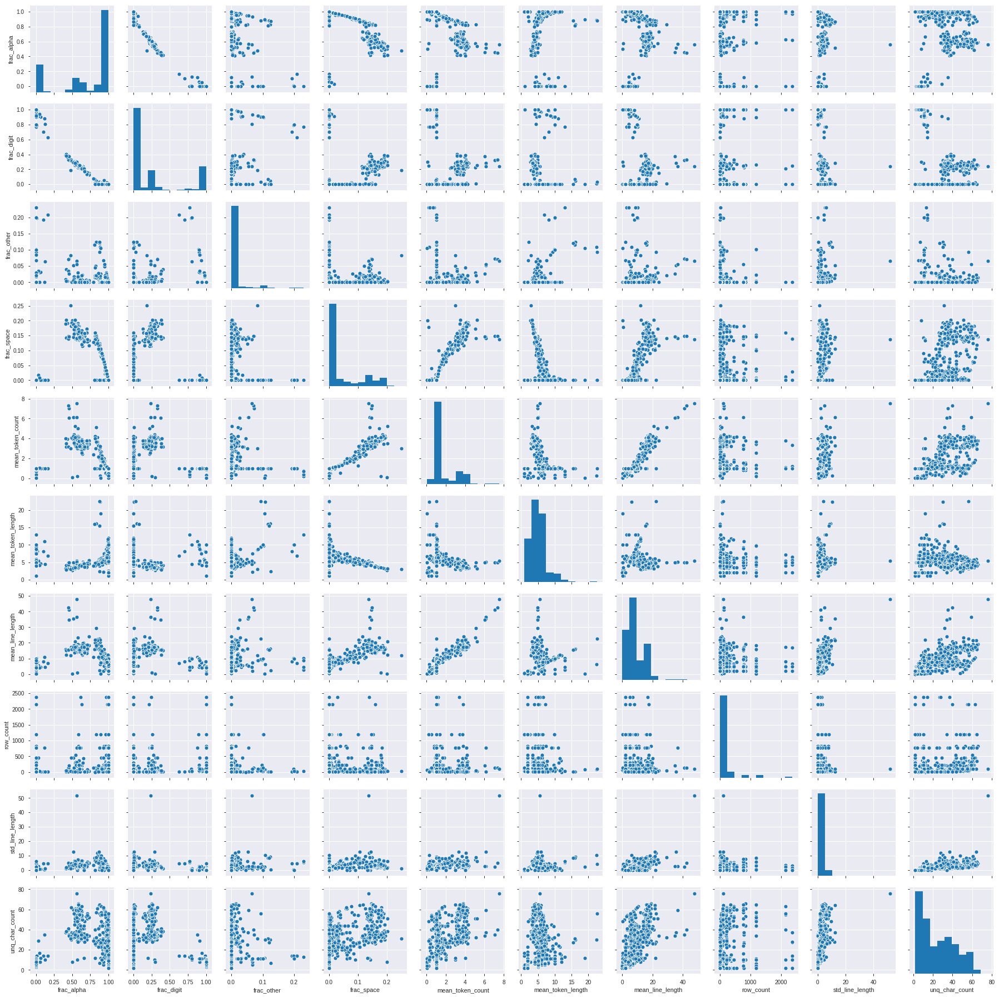

In [58]:
sns.pairplot(pairplot_df.loc[pairplot_df['main']!="",:])

LinAlgError: singular matrix

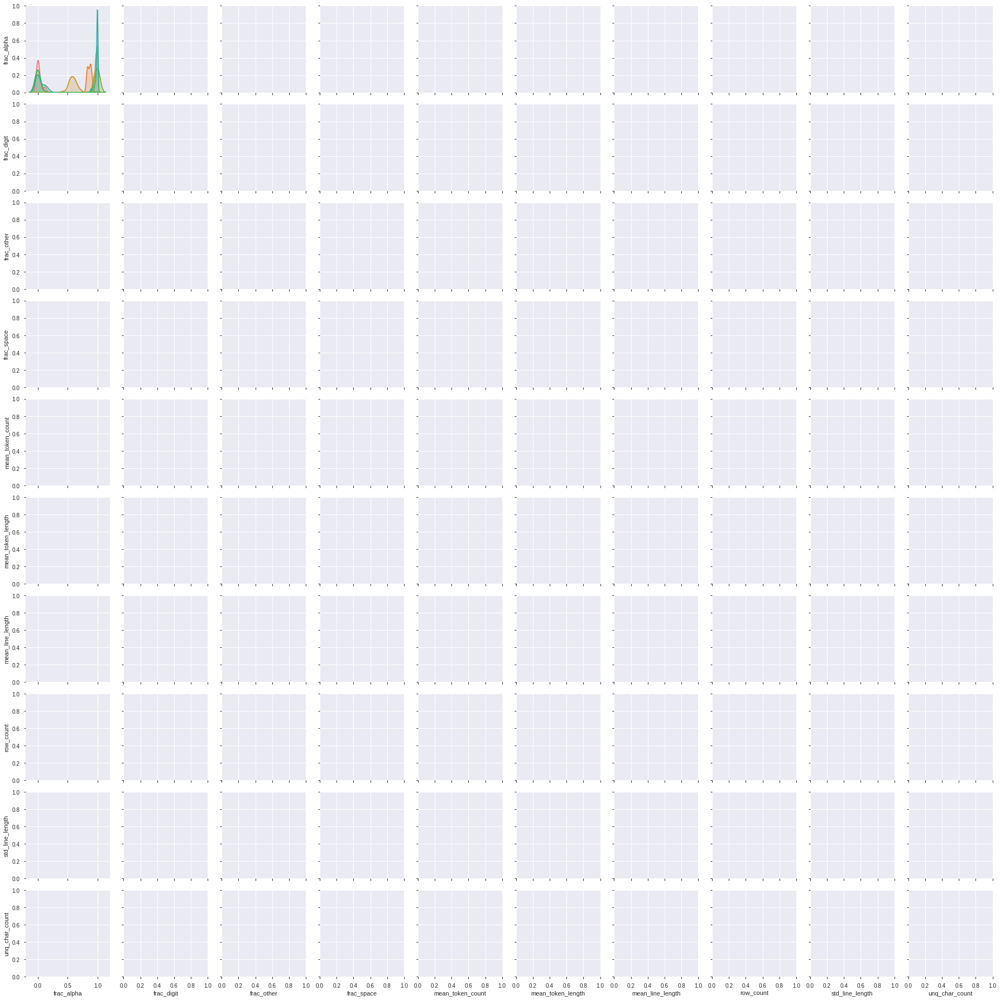

In [59]:
#sns.pairplot(pairplot_df.loc[pairplot_df['main']!="",:],hue='main')

,frac_alpha,frac_other,frac_space,mean_token_count,mean_token_length,mean_line_length,row_count,std_line_length,unq_char_count
frac_alpha,1.000000,-0.314535,-0.080149,-0.103150,-0.118916,-0.117380,0.037292,0.092169,0.157319
frac_other,-0.314535,1.000000,-0.075034,-0.036046,0.474994,0.130510,-0.061618,0.180958,-0.083435
frac_space,-0.080149,-0.075034,1.000000,0.929039,-0.206090,0.810493,-0.019859,0.427256,0.613778
mean_token_count,-0.103150,-0.036046,0.929039,1.000000,-0.209964,0.905441,-0.019058,0.485046,0.578399
mean_token_length,-0.118916,0.474994,-0.206090,-0.209964,1.000000,0.170913,-0.012401,0.211338,0.170307
mean_line_length,-0.117380,0.130510,0.810493,0.905441,0.170913,1.000000,-0.013815,0.610770,0.642172
row_count,0.037292,-0.061618,-0.019859,-0.019058,-0.012401,-0.013815,1.000000,0.013444,0.204228
std_line_length,0.092169,0.180958,0.427256,0.485046,0.211338,0.610770,0.013444,1.000000,0.551412
unq_char_count,0.157319,-0.083435,0.613778,0.578399,0.170307,0.642172,0.204228,0.551412,1.000000


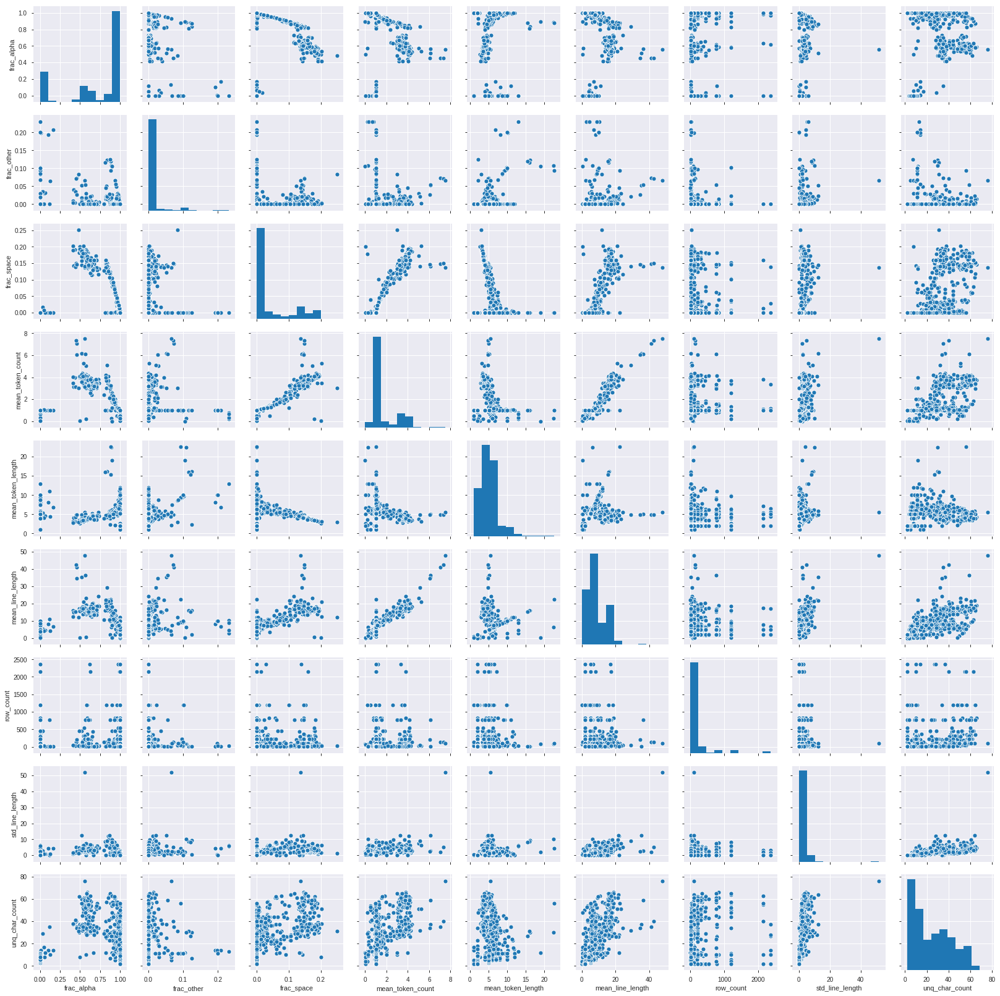

In [69]:
# remobe frac digits due to correlation
cols2 = ['main','frac_alpha', 'frac_other', 'frac_space',
       'mean_token_count', 'mean_token_length',
       'mean_line_length', 'row_count', 'std_line_length', 'unq_char_count']

temp_df = pairplot_df.loc[pairplot_df['main']!="",cols2]

display(temp_df.corr())

sns.pairplot(temp_df)

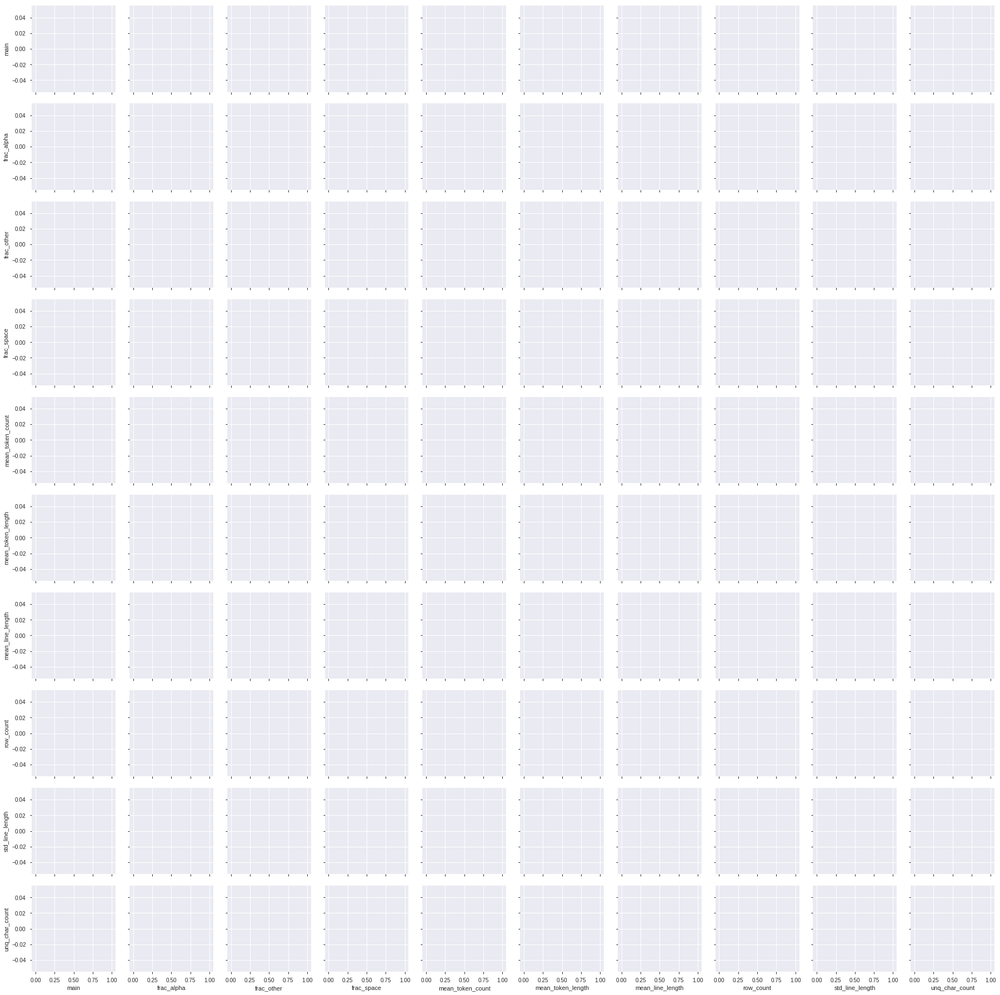

In [73]:
sns.pairplot(temp_df.loc[temp_df['main']==cols2[1],:])

apn


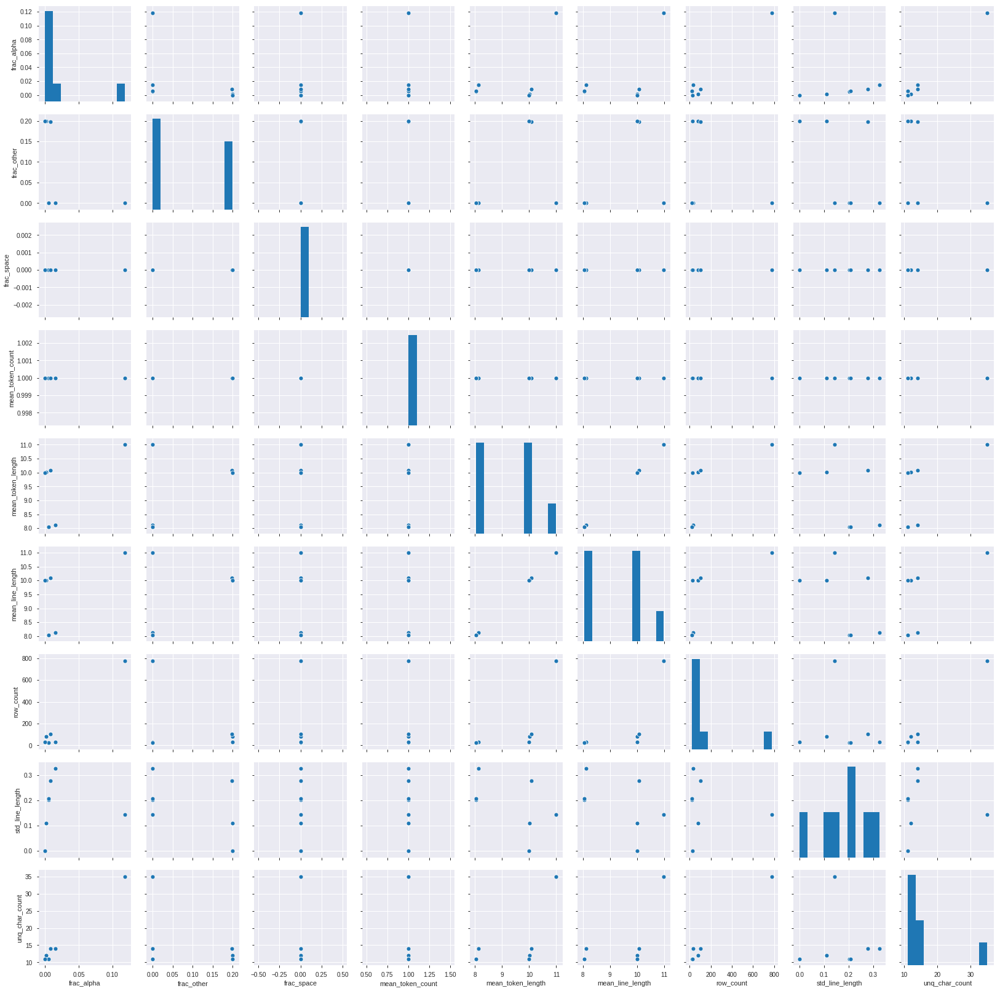

In [75]:
unique_main = temp_df['main'].unique().tolist()

i = 0
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

fullname


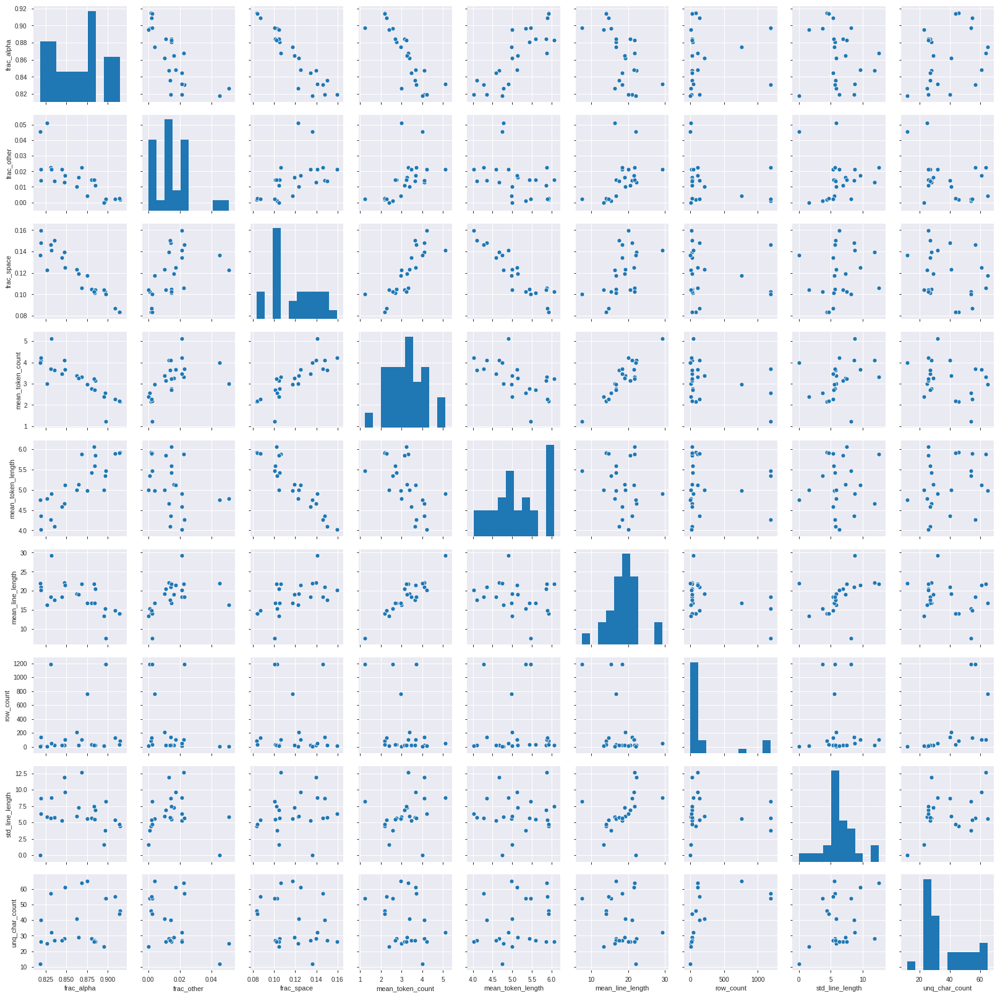

In [76]:

i = 1
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

street


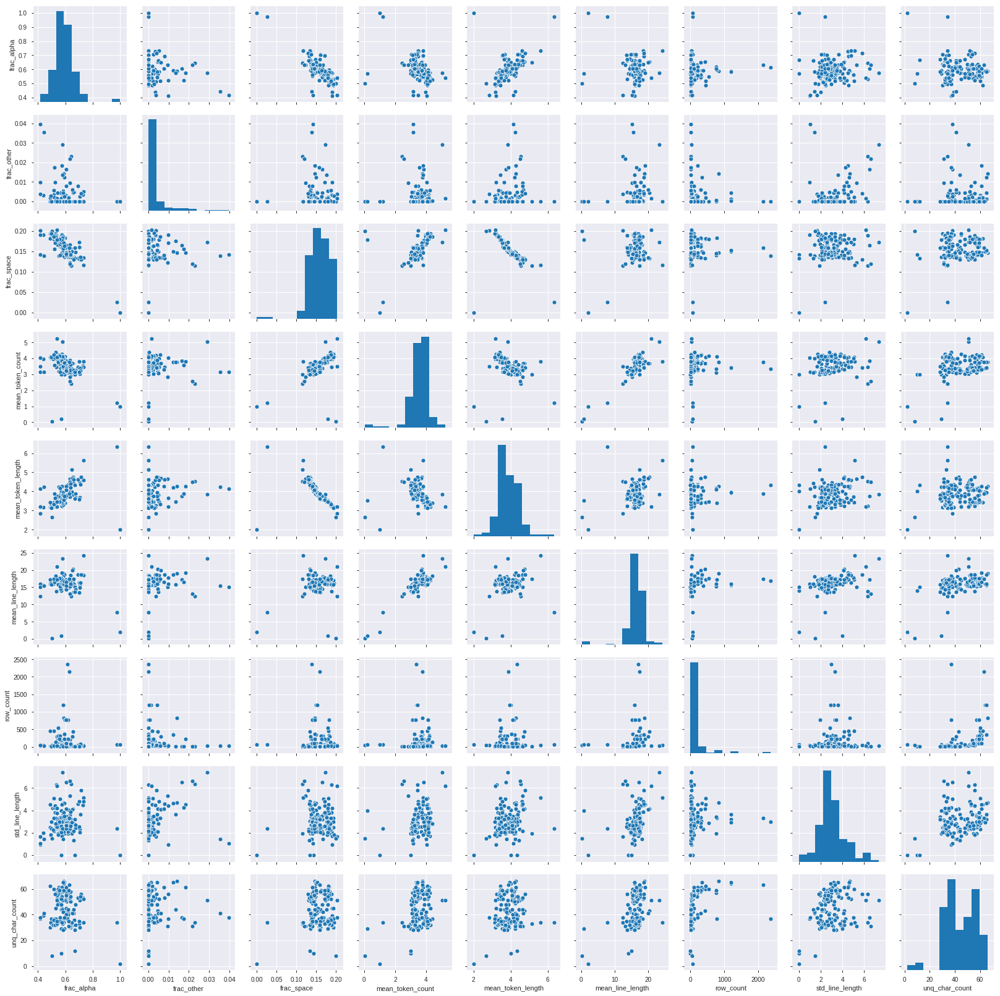

In [80]:

i = 2 
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

city


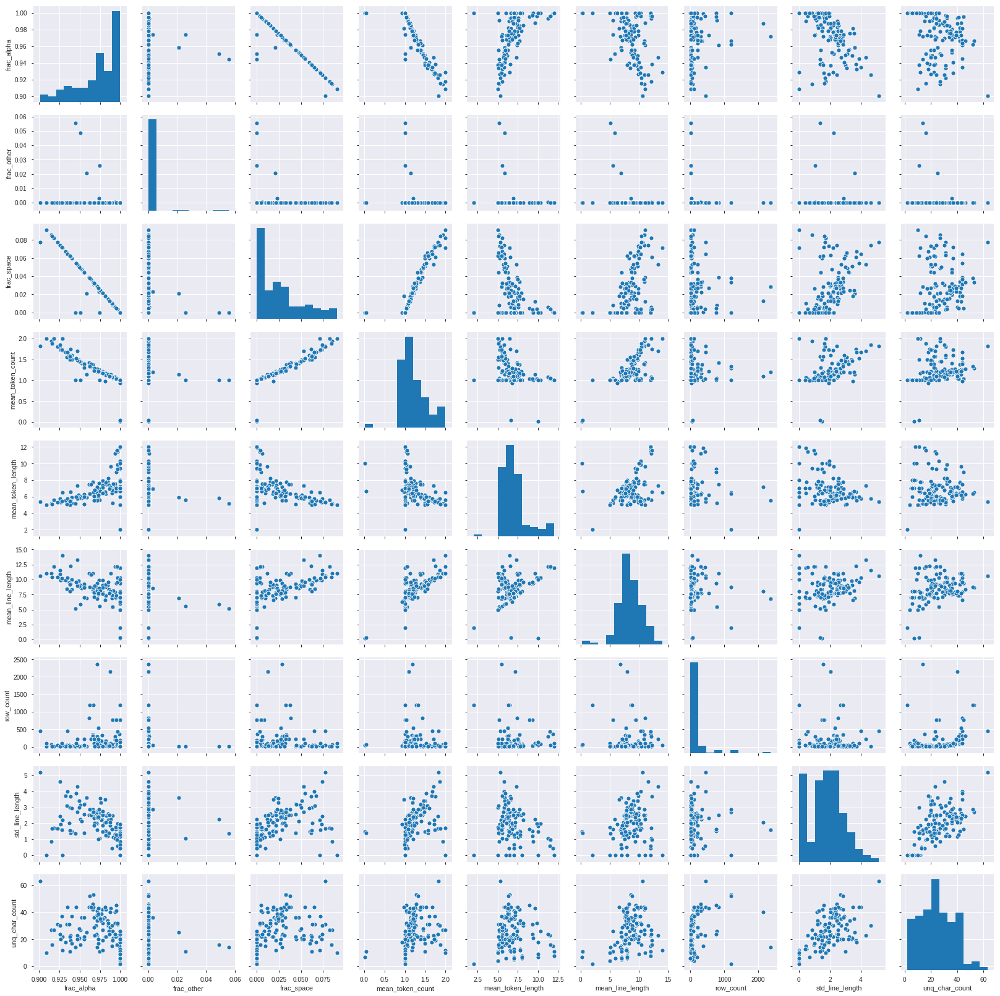

In [81]:

i = 3
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

state


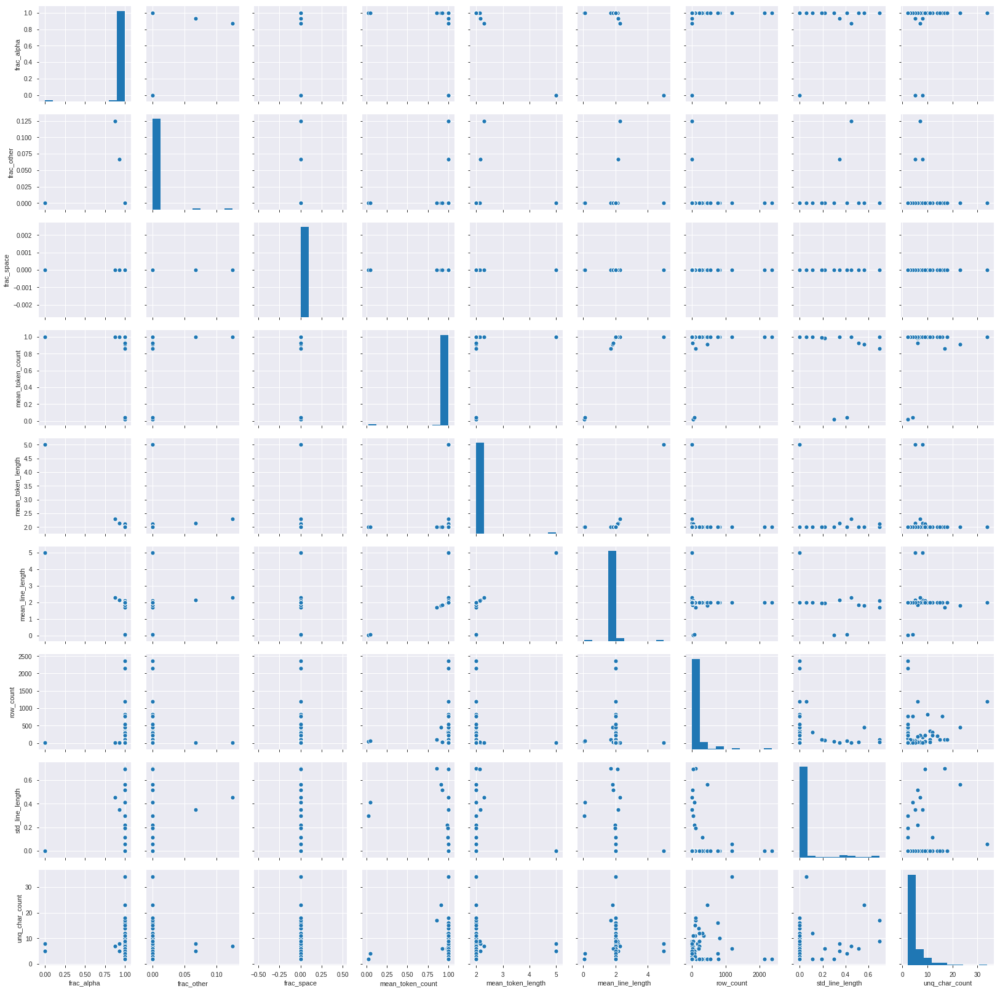

In [82]:

i = 4
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

zipcode


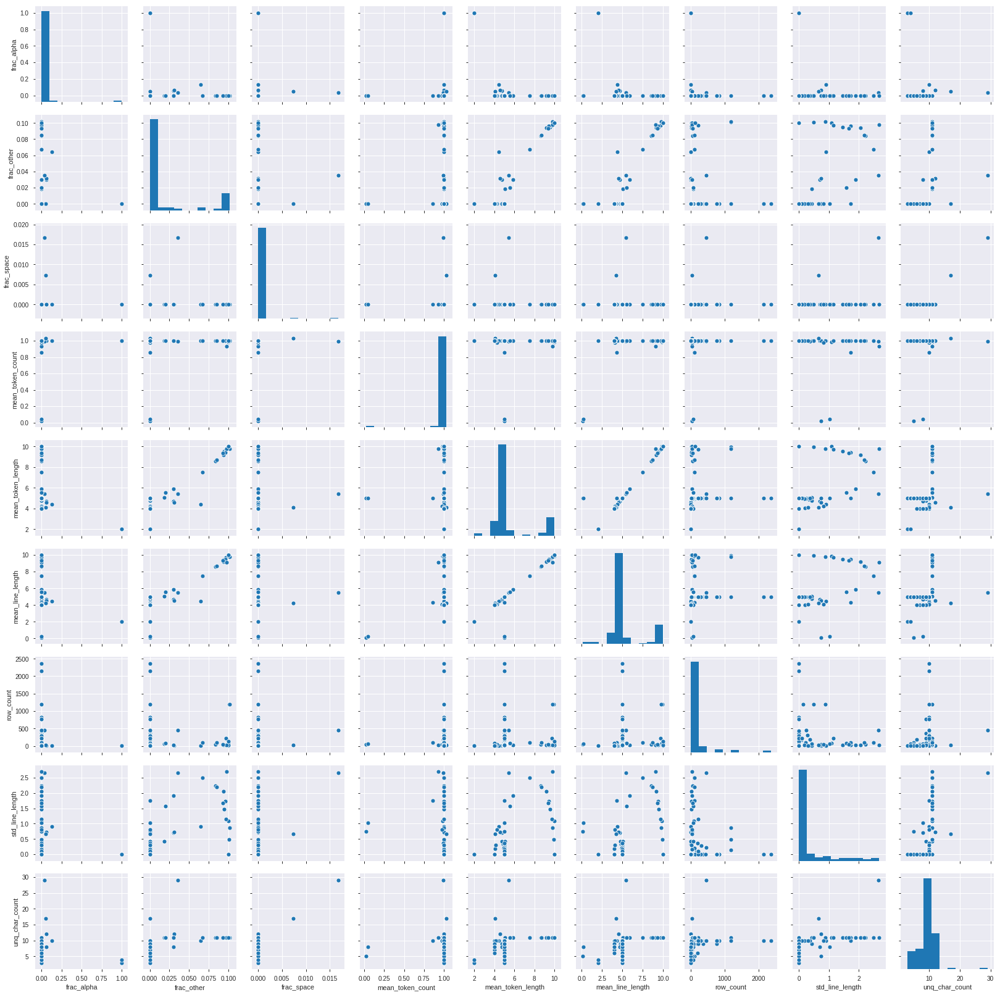

In [83]:

i = 5
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

phone


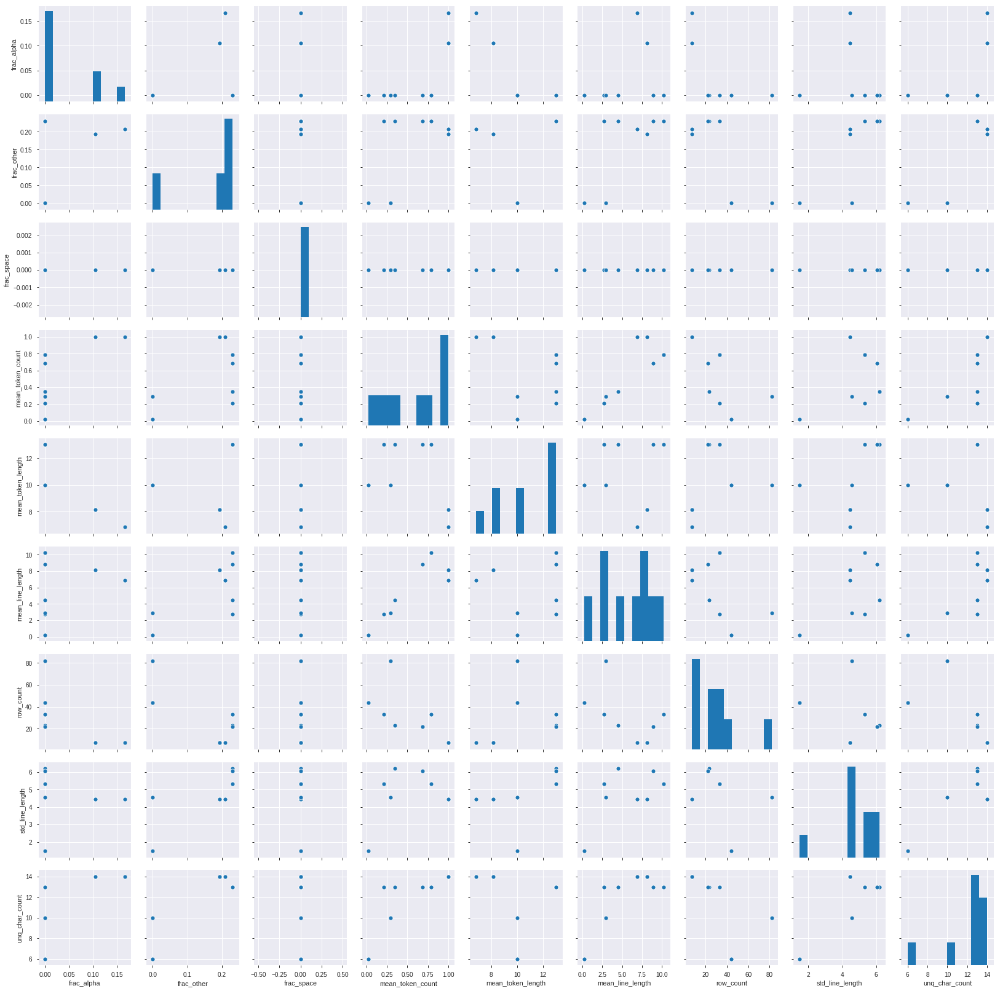

In [84]:

i = 6
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

partname


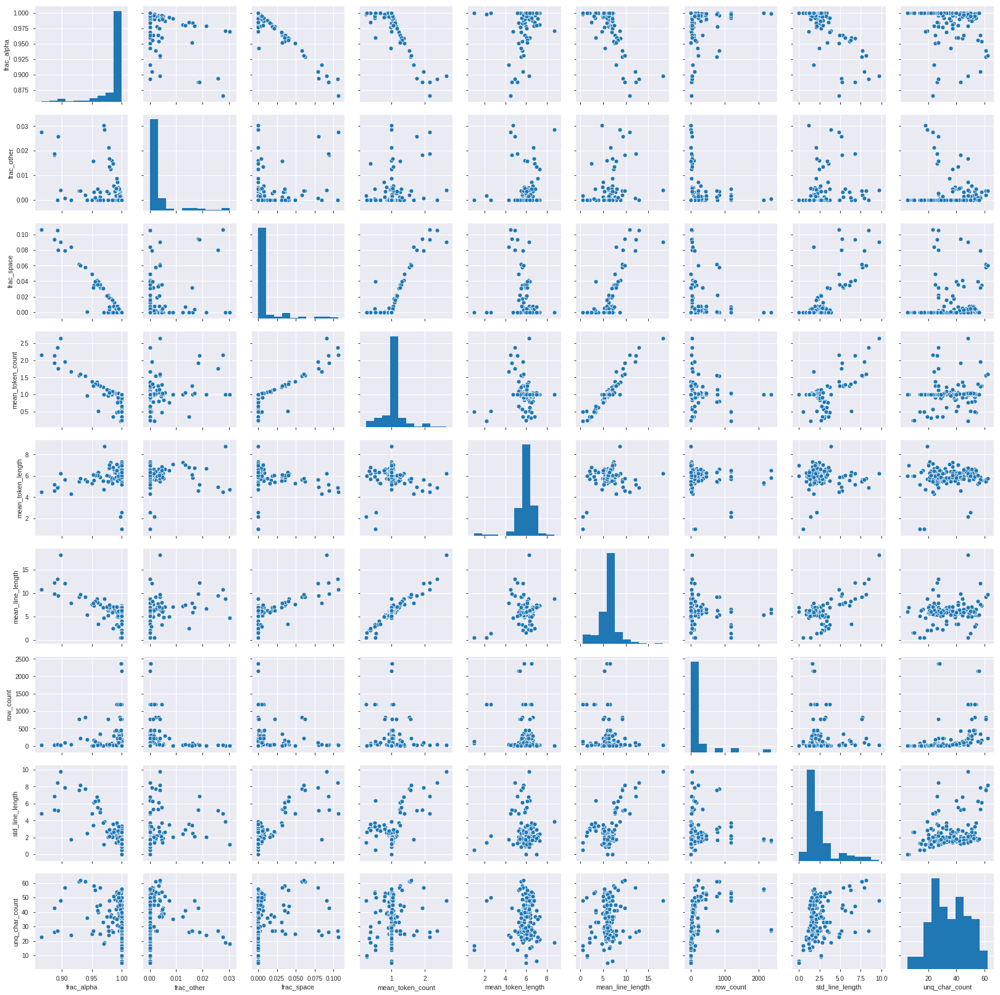

In [85]:

i = 7
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

housenumber


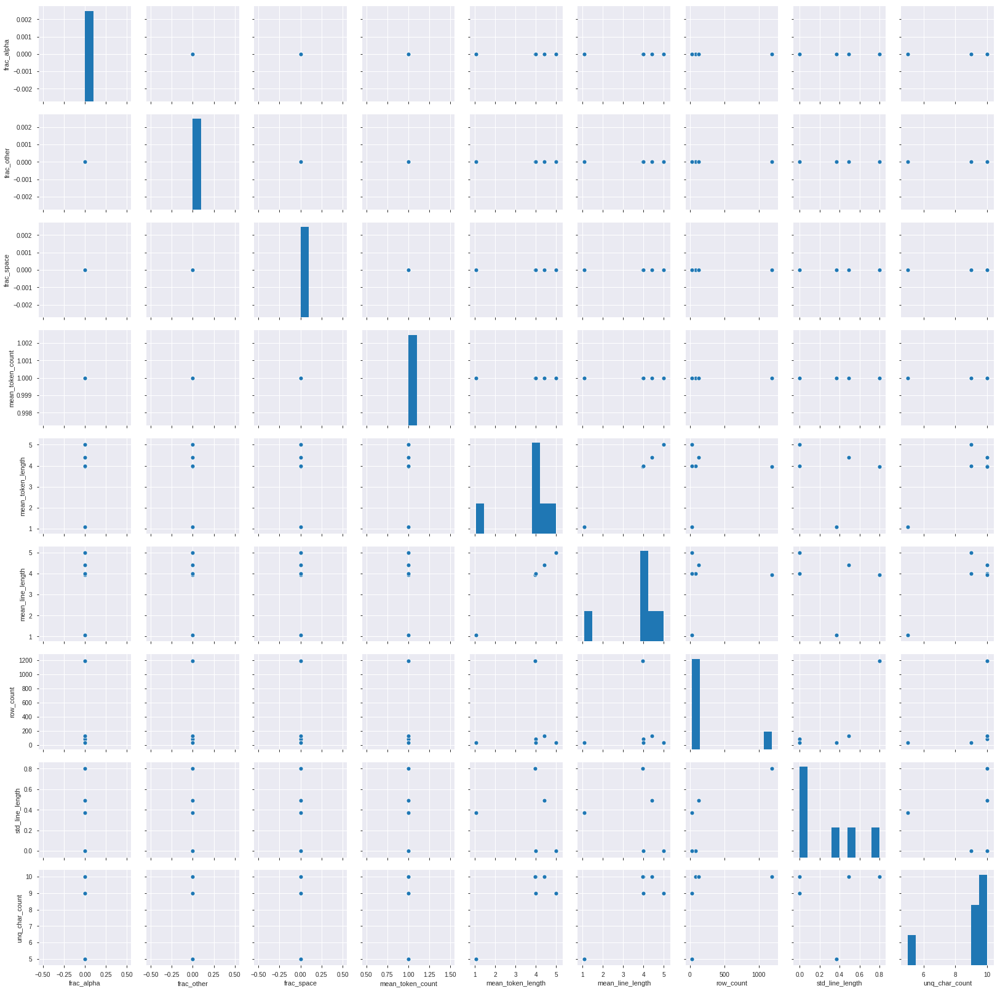

In [86]:

i = 8
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

fulladdr


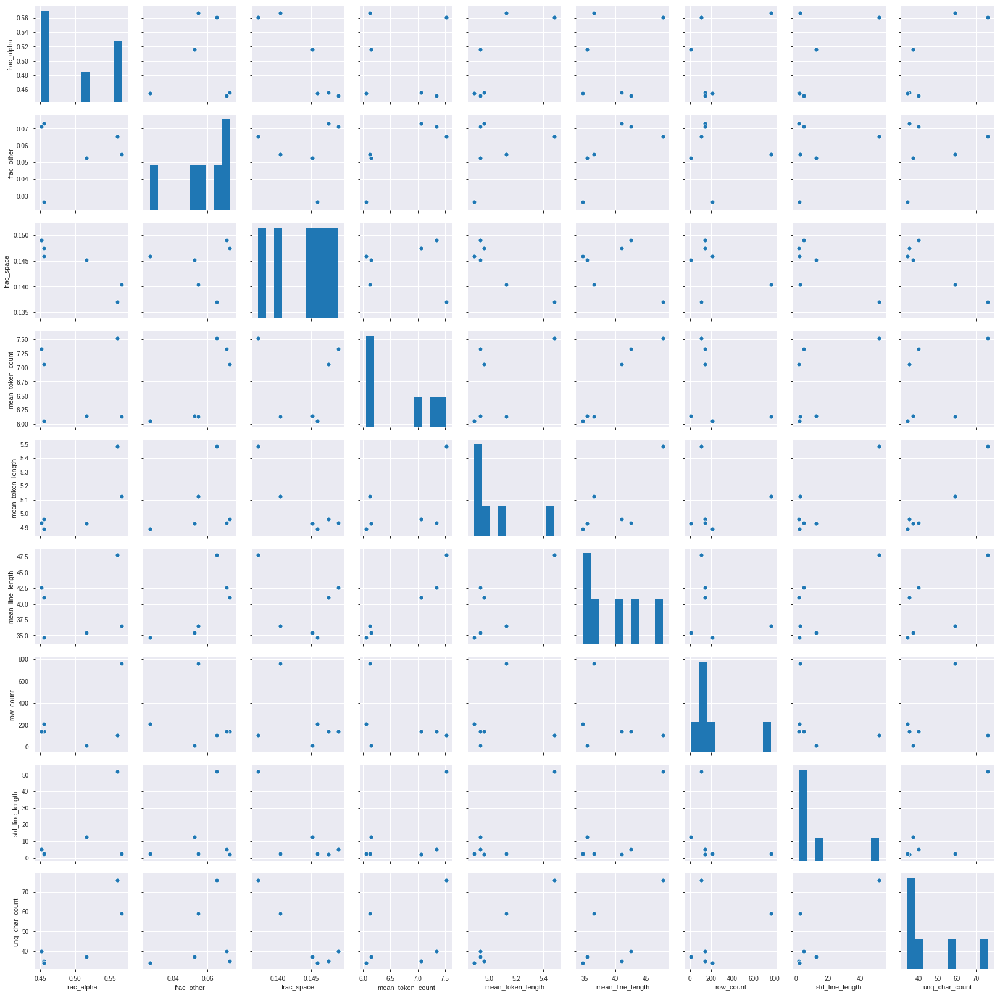

In [88]:

i = 9
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

email


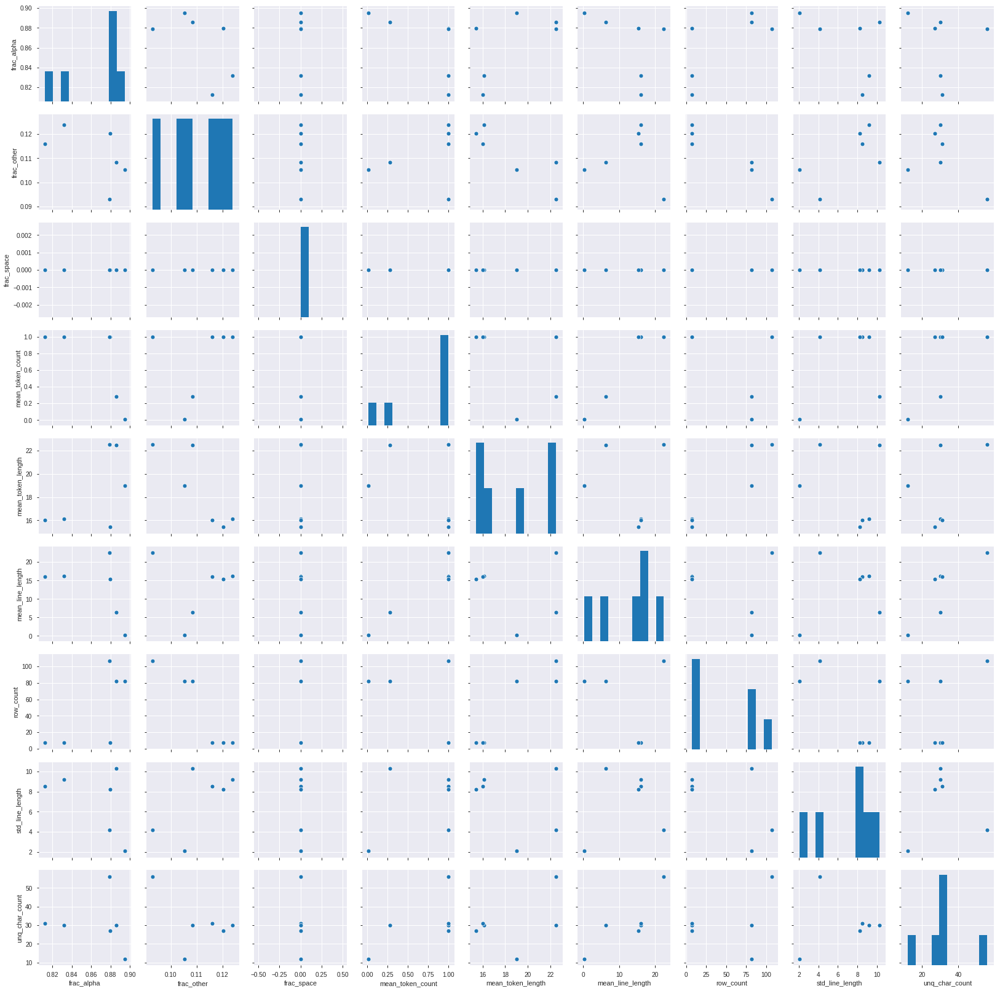

In [89]:

i = 10
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

direction


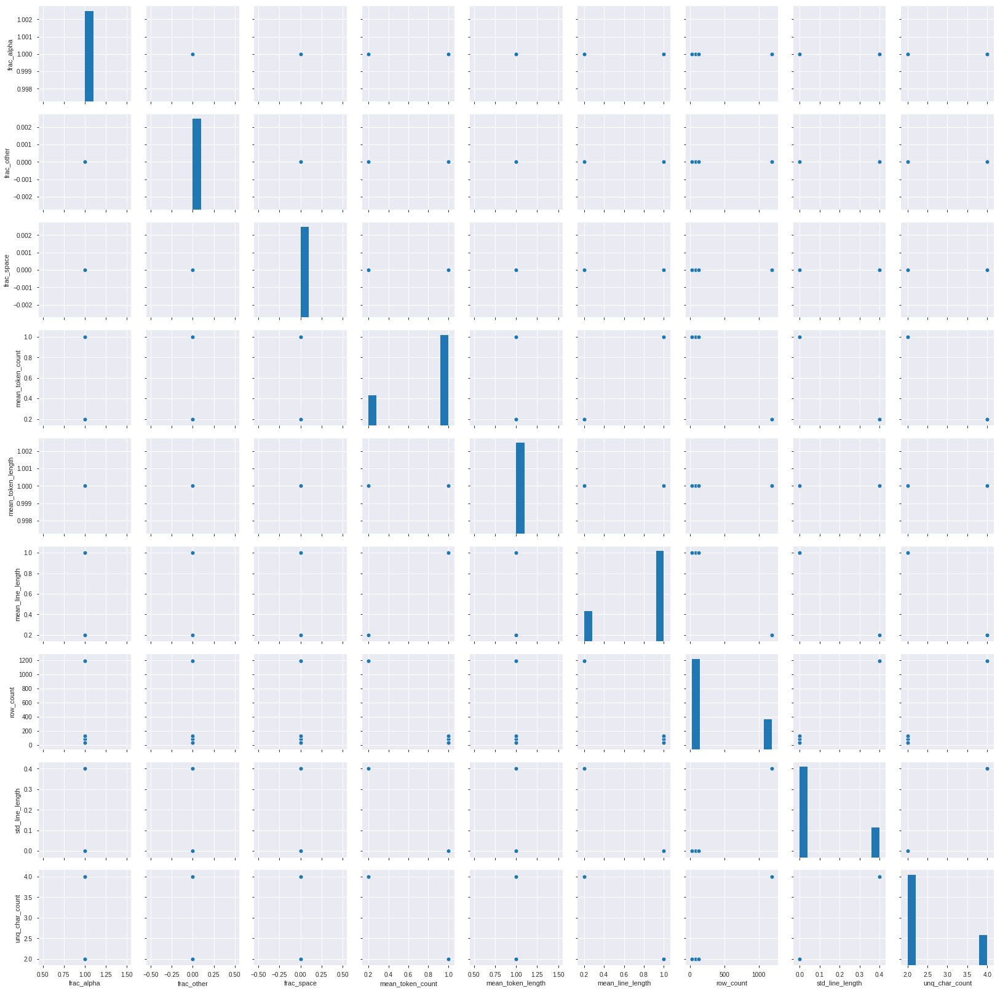

In [90]:

i = 11
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

streetname


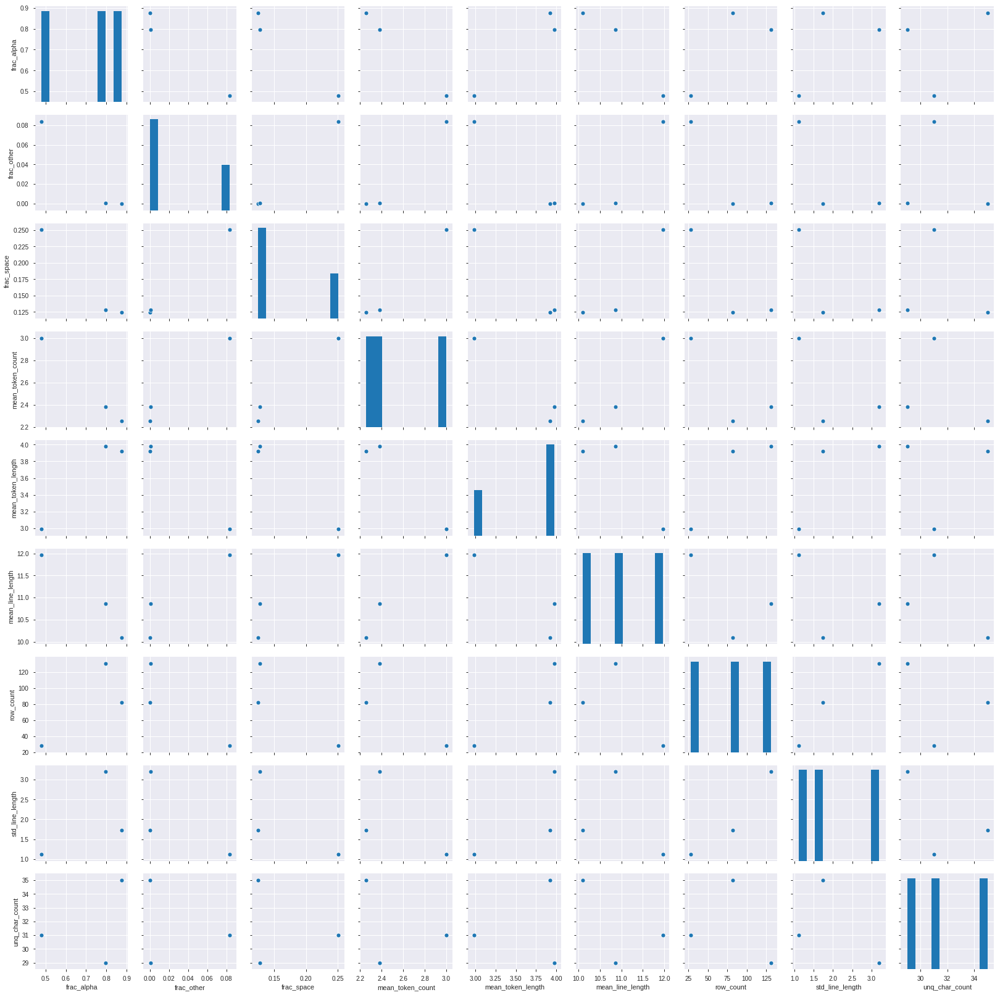

In [91]:

i = 12
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

county


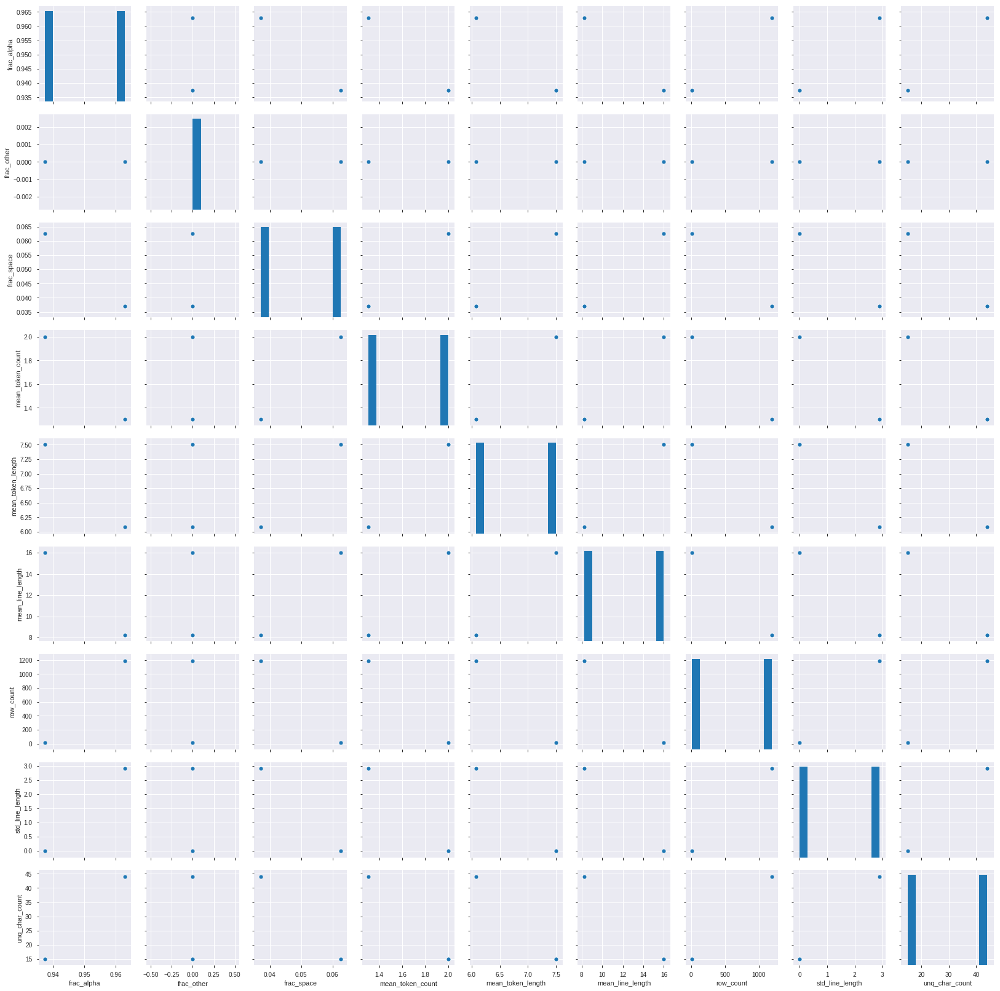

In [92]:

i = 13
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

In [93]:

i = 14
print(unique_main[i])
sns.pairplot(temp_df.loc[temp_df['main']==unique_main[i],:])

IndexError: list index out of range

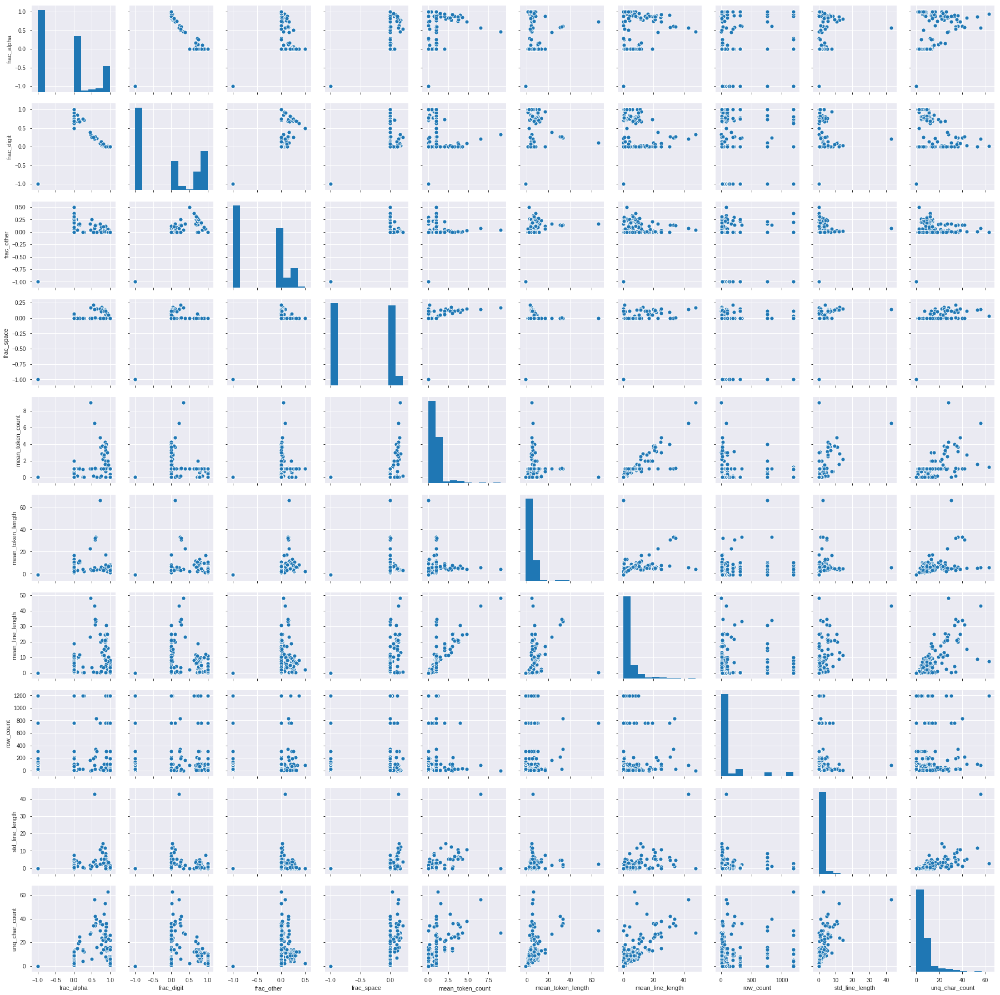

In [94]:
sns.pairplot(pairplot_df.loc[pairplot_df['main']=="",:])

In [101]:
pairplot_df['main'].unique().tolist()

['apn',
 '',
 'fullname',
 'street',
 'city',
 'state',
 'zipcode',
 'phone',
 'partname',
 'housenumber',
 'fulladdr',
 'email',
 'direction',
 'streetname',
 'county']

In [109]:
from sklearn.preprocessing import MultiLabelBinarizer, OneHotEncoder
import category_encoders as ce

In [106]:
mlb = MultiLabelBinarizer()
mlb.fit_transform(pairplot_df['main'].unique().tolist())

array([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0],
       [0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0],
       [0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0],
       [1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0]])

In [126]:
X = pairplot_df.loc[:,[i for i in pairplot_df.columns.tolist() if i != 'main']].copy()

encoder = ce.one_hot.OneHotEncoder()
Y = encoder.fit_transform(pairplot_df['main'])

In [118]:
X

,frac_alpha,frac_digit,frac_other,frac_space,mean_token_count,mean_token_length,mean_line_length,row_count,std_line_length,unq_char_count
0,0.014925,0.985075,0.000000,0.000000,1.000000,8.121212,8.121212,33,0.326374,14
1,0.000000,0.777778,0.222222,0.000000,1.000000,9.000000,9.000000,33,0.000000,7
2,0.000000,1.000000,0.000000,0.000000,1.000000,9.000000,9.000000,33,0.000000,10
3,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,33,0.000000,4
4,0.880435,0.000000,0.014493,0.105072,2.757576,5.428571,16.727273,33,5.636852,28
...,...,...,...,...,...,...,...,...,...,...
1313,0.000000,1.000000,0.000000,0.000000,1.000000,4.000000,4.000000,6,0.000000,8
1314,0.670732,0.170732,0.000000,0.158537,3.166667,3.631579,13.666667,6,3.197221,28
1315,0.978261,0.000000,0.000000,0.021739,1.166667,6.428571,7.666667,6,1.490712,19
1316,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,2.000000,6,0.000000,2


In [119]:
Y

,main_1,main_2,main_3,main_4,main_5,main_6,main_7,main_8,main_9,main_10,main_11,main_12,main_13,main_14,main_15
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1313,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1314,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1315,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1316,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [218]:
Y.describe()

,main_1,main_2,main_3,main_4,main_5,main_6,main_7,main_8,main_9,main_10,main_11,main_12,main_13,main_14,main_15
count,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000,1318.000000
mean,0.005311,0.400607,0.021244,0.113050,0.110015,0.109256,0.099393,0.006829,0.113809,0.004552,0.004552,0.004552,0.003035,0.002276,0.001517
std,0.072711,0.490207,0.144252,0.316774,0.313027,0.312079,0.299303,0.082384,0.317699,0.067343,0.067343,0.067343,0.055027,0.047673,0.038940
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [121]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

/usr/local/lib/python3.5/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [138]:
# X,Y = make_classification(n_samples=100,
#                           n_features=4,
#                           n_informative=2, 
#                           n_redundant=0, 
#                           random_state=90210, 
#                           shuffle=False)

clf = RandomForestClassifier(n_estimators=1000, 
                             oob_score=True, 
                             max_features='log2', 
                             max_depth=4, 
                             random_state=90210)

clf.fit(X,Y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features='log2', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=1,
            oob_score=True, random_state=90210, verbose=0,
            warm_start=False)

In [139]:
print(clf.feature_importances_)

[0.2081852  0.10599829 0.03013077 0.08518345 0.11292245 0.14771585
 0.18602815 0.00224719 0.04556236 0.07602629]


In [141]:
1 - clf.oob_score_

0.02038442083965597

In [148]:
# from sklearn.model_selection import KFold
# kf = KFold(n_splits=3)
# kf.get_n_splits(X)
# for train_index, test_index in kf.split(X):
#     X_train, X_test = X.iloc[train_index,:], X.iloc[test_index,:]
#     Y_train, Y_test = Y.iloc[train_index,:], Y.iloc[test_index,:]

In [149]:
clf.set_params(n_estimators=200)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features='log2', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=1,
            oob_score=True, random_state=90210, verbose=0,
            warm_start=False)

In [154]:
for k, (train, test) in enumerate(kf.split(X, Y)):
    clf.fit(X.iloc[train,:], Y.iloc[train,:])
    print(clf.classes_)
    print("[fold {0}] alpha: {1:.5f}, score: {2:.5f}".
          format(k, clf.score(X.iloc[test,:], Y.iloc[test,:])))

[array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0, 1]), array([0]), array([0, 1]), array([0, 1]), array([0, 1])]


IndexError: tuple index out of range

In [155]:
clf.score(X,Y)

0.7617602427921093

In [209]:
from sklearn.metrics import roc_curve, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

In [162]:

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.33)
    

In [186]:
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred,Y_test))
# confusion_matrix(y_pred,Y_test)
# fpr_rf, tpr_rf, _ = roc_curve(Y_test, y_pred_rf)

0.7310344827586207


In [235]:
y_pred[:,i]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [236]:
Y_test.iloc[:,i]

341     0
327     0
465     0
994     0
214     0
       ..
1010    0
58      0
1131    0
928     0
270     0
Name: main_1, Length: 435, dtype: int64

In [248]:

y_pred = clf.predict(X_test)
values = pairplot_df['main'].unique().tolist()
print(values)

for i in range(len(values)):
    print("\nlabel",i,":",values[i])
    print("acc: ",accuracy_score(y_pred[:,i],Y_test.iloc[:,i]))
#     print(accuracy_score(Y_test.iloc[:,i],y_pred[:,i]))
    print("f1: ",f1_score(y_pred[:,i],Y_test.iloc[:,i]))
#     print(f1_score(Y_test.iloc[:,i],y_pred[:,i]))

    print(confusion_matrix(y_pred[:,i],Y_test.iloc[:,i]))
#     print(confusion_matrix(Y_test.iloc[:,i],y_pred[:,i]))

['apn', '', 'fullname', 'street', 'city', 'state', 'zipcode', 'phone', 'partname', 'housenumber', 'fulladdr', 'email', 'direction', 'streetname', 'county']

label 0 : apn
acc:  0.993103448275862
f1:  0.0
[[432   3]
 [  0   0]]

label 1 : 
acc:  0.871264367816092
f1:  0.8444444444444444
[[227  49]
 [  7 152]]

label 2 : fullname
acc:  0.9793103448275862
f1:  0.18181818181818182
[[425   9]
 [  0   1]]

label 3 : street
acc:  0.9885057471264368
f1:  0.9438202247191011
[[388   1]
 [  4  42]]

label 4 : city
acc:  0.9402298850574713
f1:  0.6829268292682927
[[381  22]
 [  4  28]]

label 5 : state
acc:  0.9839080459770115
f1:  0.9066666666666667
[[394   2]
 [  5  34]]

label 6 : zipcode
acc:  0.967816091954023
f1:  0.8205128205128205
[[389   8]
 [  6  32]]

label 7 : phone
acc:  0.993103448275862
f1:  0.0
[[432   3]
 [  0   0]]

label 8 : partname
acc:  0.9655172413793104
f1:  0.7945205479452055
[[391  13]
 [  2  29]]

label 9 : housenumber
acc:  0.9954022988505747
f1:  0.0
[[433   2]
 [  0  

In [ ]:
i=1
y_pred = clf.predict(X_test)
print(y_pred.shape)
# print(accuracy_score(y_pred[:,i],Y_test.iloc[:,i]))
print(accuracy_score(Y_test.iloc[:,i],y_pred[:,i]))
# print(f1_score(y_pred[:,i],Y_test.iloc[:,i]))
print(f1_score(Y_test.iloc[:,i],y_pred[:,i]))

print(confusion_matrix(y_pred[:,i],Y_test.iloc[:,i]))
print(confusion_matrix(Y_test.iloc[:,i],y_pred[:,i]))

fpr_rf, tpr_rf, _ = roc_curve(Y_test.iloc[:,i],y_pred[:,i])

plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_rf, tpr_rf, label='RF')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

(435, 15)
0.871264367816092
0.8444444444444444
[[227  49]
 [  7 152]]
[[227   7]
 [ 49 152]]


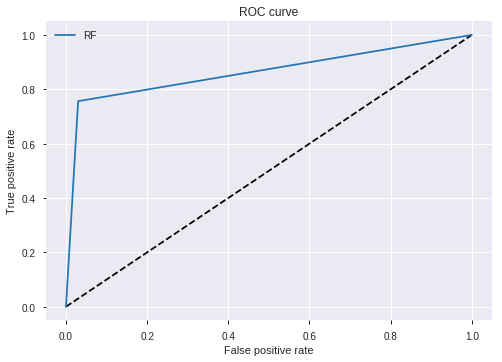

In [237]:
i=1
y_pred = clf.predict(X_test)
print(y_pred.shape)
# print(accuracy_score(y_pred[:,i],Y_test.iloc[:,i]))
print(accuracy_score(Y_test.iloc[:,i],y_pred[:,i]))
# print(f1_score(y_pred[:,i],Y_test.iloc[:,i]))
print(f1_score(Y_test.iloc[:,i],y_pred[:,i]))

print(confusion_matrix(y_pred[:,i],Y_test.iloc[:,i]))
print(confusion_matrix(Y_test.iloc[:,i],y_pred[:,i]))

fpr_rf, tpr_rf, _ = roc_curve(Y_test.iloc[:,i],y_pred[:,i])

plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_rf, tpr_rf, label='RF')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

In [ ]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_rf, tpr_rf, label='RF')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()